In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import os
import matplotlib.pyplot as plt

from tqdm import tqdm

import PIL.Image

import torch
from torch import nn
import torch.nn.functional as F
from torch.utils.data import Dataset
import torch.optim as optim

import torchvision
from torchvision.transforms import ToTensor
from torchvision.io import read_image
from torchvision import datasets, models, transforms

import pytorch_lightning as pl

import skimage
from sklearn.preprocessing import LabelEncoder

torch.manual_seed(42)

pd.set_option('display.max_colwidth', 100)
pd.set_option('display.max_rows', 100)

In [2]:
DATASET_DIR = r"C:\Users\rosch\Desktop\ML4B\complete"
df_artwork = pd.read_csv(f"{DATASET_DIR}/artwork_dataset.csv")
df_info = pd.read_csv(f"{DATASET_DIR}/info_dataset.csv")

# path filename
os.path.exists(f"{DATASET_DIR}/artwork/0.jpg")

True

# What are these CSVs?

In [30]:
df_artwork[:5]

,ID,artist,title,picture data,file info,jpg url
0,0,"AACHEN, Hans von",venus and adonis,"1574-88, oil on canvas, 68 x 95 cm, fogg art museum, harvard university, cambridge","1700*1211, true color, 252 kb",https://www.wga.hu/art/a/aachen/adonis.jpg
1,1,"AACHEN, Hans von",procuring scene,"1605-10, oil on wood, 114 x 130 cm, kunsthistorisches museum, vienna","1370*1168, true color, 212 kb",https://www.wga.hu/art/a/aachen/z_scene.jpg
2,2,"AACHEN, Hans von",self-portrait with a glass of wine,"c. 1596, oil on canvas, 53 x 44 cm, private collection","896*1074, true color, 57 kb",https://www.wga.hu/art/a/aachen/selfport.jpg
3,3,"AACHEN, Hans von",two laughing men (self-portrait),"before 1574, oil on panel, 48 x 39 cm, archdiocesan museum, kromeriz","1173*1500, true color, 210 kb",https://www.wga.hu/art/a/aachen/selfpor1.jpg
4,4,"AACHEN, Hans von",portrait of emperor rudolf ii,"1606-08, oil on canvas, 60 x 48 cm, kunsthistorisches museum, vienna","1149*1500, true color, 247 kb",https://www.wga.hu/art/a/aachen/rudolf2.jpg


In [31]:
df_info[:5]

,artist,born-died,period,school,url,base,nationality
0,"AACHEN, Hans von",(1552-1615),Mannerism,painter,https://www.wga.hu/html/a/aachen/index.html,Germany,German
1,"AAGAARD, Carl Frederik",(1833-1895),Realism,painter,https://www.wga.hu/html/a/aagaard/index.html,Copenhagen,Danish
2,"ABADIA, Juan de la",(active 1470-1490),Early Renaissance,painter,https://www.wga.hu/html/a/abadia/index.html,Huesca,Spanish
3,"ABADIE, Paul",(1812-1884),Art Nouveau,architect,https://www.wga.hu/html/a/abadie/index.html,Paris,French
4,"ABAQUESNE, Masséot",(c 1500-1564),High Renaissance,potter,https://www.wga.hu/html/a/abaquesn/index.html,France,French


In [32]:
print(df_artwork["artist"].nunique())
df_artwork["artist"].value_counts()[:40]

5565


artist
GIOTTO di Bondone                 551
REMBRANDT Harmenszoon van Rijn    539
RAFFAELLO Sanzio                  439
GOGH, Vincent van                 420
CRANACH, Lucas the Elder          339
RUBENS, Peter Paul                331
TINTORETTO                        282
TIZIANO Vecellio                  275
VERONESE, Paolo                   265
GRECO, El                         255
TIEPOLO, Giovanni Battista        251
DONATELLO                         245
ANGELICO, Fra                     244
BRUEGEL, Pieter the Elder         223
LEONARDO da Vinci                 215
MEMLING, Hans                     209
BERNINI, Gian Lorenzo             207
MANTEGNA, Andrea                  204
BOTTICELLI, Sandro                204
MONET, Claude                     198
GOYA Y LUCIENTES, Francisco de    197
PIERO DELLA FRANCESCA             190
CARAVAGGIO                        185
GAUGUIN, Paul                     184
DUCCIO di Buoninsegna             170
WEYDEN, Rogier van der            170
GHIRL

In [33]:
df_info["period"].value_counts()

period
Baroque                 1945
Rococo                   458
Mannerism                423
Romanticism              408
Neoclassicism            397
Early Renaissance        382
Realism                  355
Northern Renaissance     341
Medieval                 289
High Renaissance         279
Impressionism            186
Art Nouveau              108
Name: count, dtype: int64

In [34]:
df_info["school"].value_counts()

school
painter          3554
sculptor          831
architect         607
graphic           328
goldsmith          83
illuminator        62
cabinet-maker      38
glass              20
tapestry           17
miniaturist        16
potter             15
Name: count, dtype: int64

In [35]:
df_combined = df_artwork.merge(df_info)
# painters only
df_combined = df_combined[df_combined["school"] == "painter"]

In [36]:
selected_styles = ["Romanticism", "Baroque", "High Renaissance", "Realism", "Impressionism", "Medieval"]
df_period_artists_vc = df_combined.groupby(["period"])["artist"].value_counts()
df_period_artists_vc.groupby(level='period').nlargest(5)

period                period                artist                              
Art Nouveau           Art Nouveau           KLIMT, Gustav                            44
                                            DENIS, Maurice                           30
                                            MOSER, Koloman                           26
                                            MUNCH, Edvard                            24
                                            BONNARD, Pierre                          22
Baroque               Baroque               REMBRANDT Harmenszoon van Rijn          539
                                            RUBENS, Peter Paul                      331
                                            CARAVAGGIO                              185
                                            CANALETTO                               159
                                            HALS, Frans                             153
Early Renaissance     Early Renaissance

In [37]:
print(df_combined["artist"].nunique())
df_combined["artist"].value_counts()

3554


artist
GIOTTO di Bondone                 551
REMBRANDT Harmenszoon van Rijn    539
RAFFAELLO Sanzio                  439
GOGH, Vincent van                 420
CRANACH, Lucas the Elder          339
                                 ... 
ZIMMERMANN, Carl Friedrich          1
AENVANCK, Theodoor                  1
ADLER, Salomon                      1
ACHENBACH, Oswald                   1
ABBATINI, Guido Ubaldo              1
Name: count, Length: 3554, dtype: int64

In [38]:
df_combined.shape

(33611, 12)

# Selecting some artists I know

In [39]:
# 6 periods / schools, 13 artists
romantics = ["GOYA Y LUCIENTES, Francisco de", "DELACROIX, Eugène"]
medievals = ["GIOTTO di Bondone", "DUCCIO di Buoninsegna"]
northern_rens = ["BRUEGEL, Pieter the Elder", "BOSCH, Hieronymus"]
# excluding Da Vinci -- a lot are draft works "LEONARDO da Vinci", 
early_rens = ["ANGELICO, Fra", "BOTTICELLI, Sandro"]
impressionists = ["GOGH, Vincent van", "MONET, Claude"]
baroque = ["REMBRANDT Harmenszoon van Rijn", "CARAVAGGIO"]

In [40]:
class SquarePad:
    def __call__(self, image):
        w, h = image.size
        max_wh = np.max([w, h])
        hp = int((max_wh - w) / 2)
        vp = int((max_wh - h) / 2)
        padding = (hp, vp, hp, vp)
        return torchvision.transforms.functional.pad(image, padding, 0, 'constant')
    
def display_gallery(df: pd.DataFrame, title):
    list_images = []
    df_copy = df.sample(10).copy()
    for i in range(10):
        img_path = f'{DATASET_DIR}/artwork/{df_copy.iloc[i]["ID"]}.jpg'
        img = PIL.Image.open(img_path).convert('RGB')
#         img = PIL.Image.open(img_path).convert('RGBA')
#         background = PIL.Image.new('RGBA', img.size, (255,255,255))
#         img_with_no_alpha = PIL.Image.alpha_composite(background, img)
        img_padded = SquarePad()(img)
        img_resized = transforms.Resize((224,224))(img_padded)

        list_images.append(np.array(img_resized))
    
    plt.imshow(skimage.util.montage(np.array(list_images), grid_shape=(2, 5), channel_axis=3))
    plt.title(title)
    plt.axis('off')

# Gallery

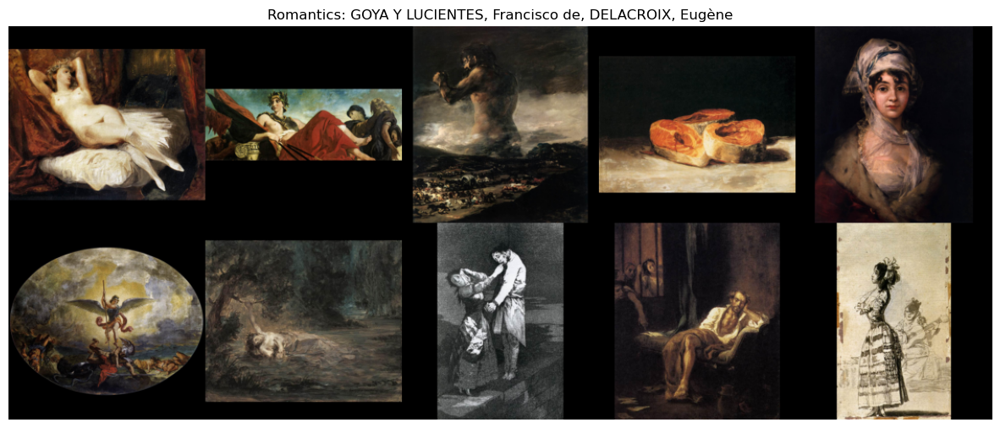

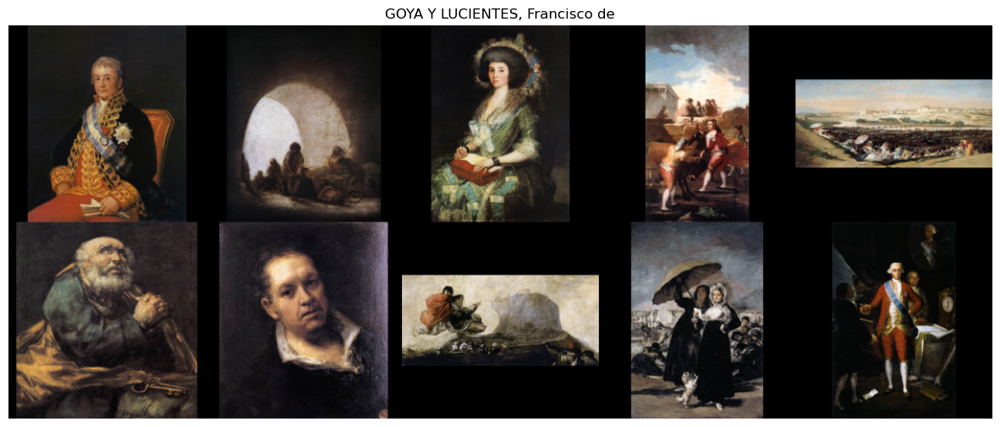

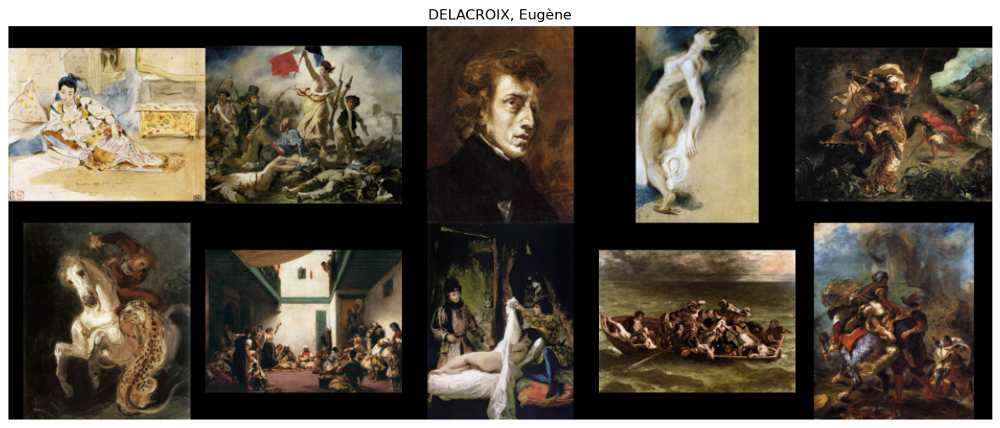

In [41]:
df_sub = df_combined[df_combined["artist"].isin(romantics)]
plt.figure(figsize=(15, 15))
display_gallery(df_sub, f"Romantics: {', '.join(romantics)}")

for name in romantics:
    plt.figure(figsize=(15, 15))
    display_gallery(df_combined[df_combined["artist"] == name], name)

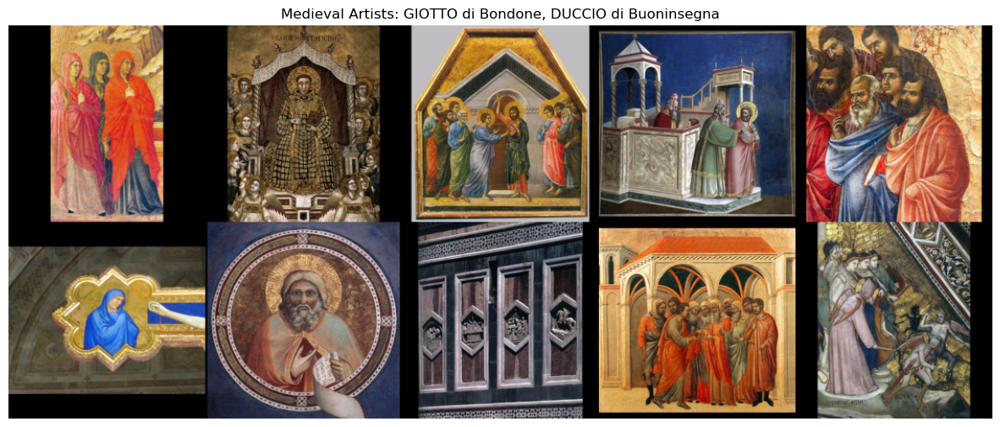

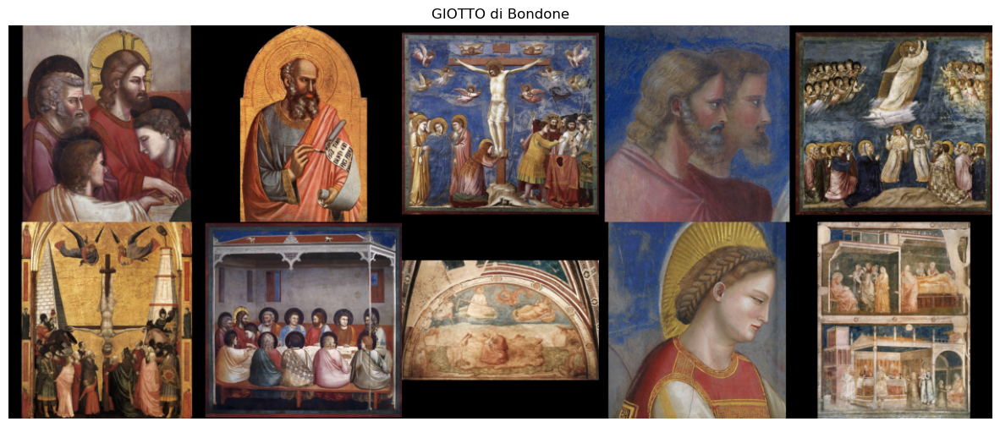

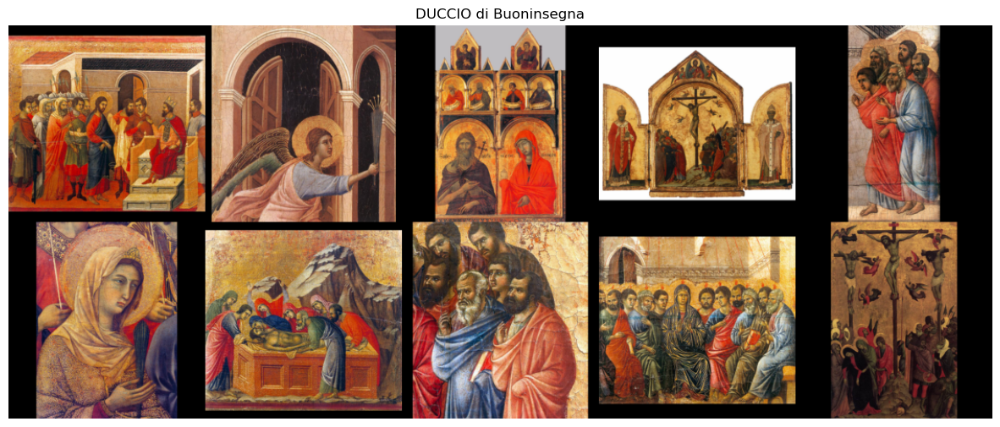

In [42]:
df_sub = df_combined[df_combined["artist"].isin(medievals)]
plt.figure(figsize=(15, 15))
display_gallery(df_sub, f"Medieval Artists: {', '.join(medievals)}")

for name in medievals:
    plt.figure(figsize=(15, 15))
    display_gallery(df_combined[df_combined["artist"] == name], name)

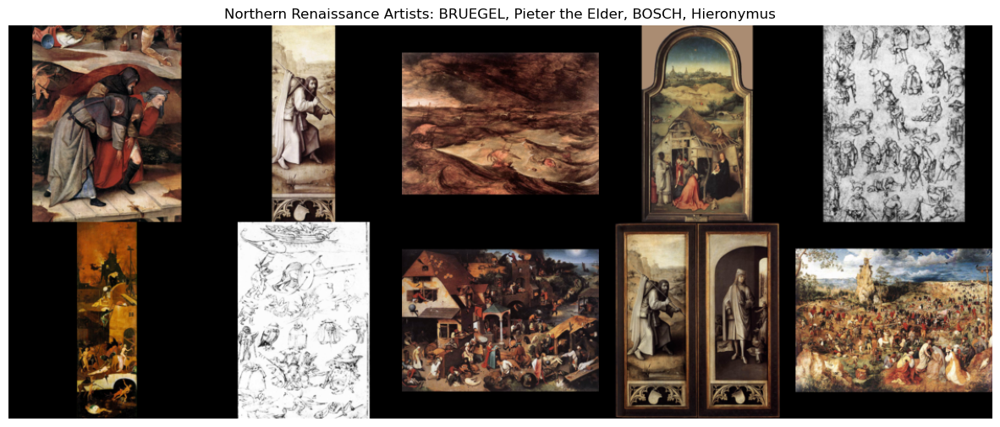

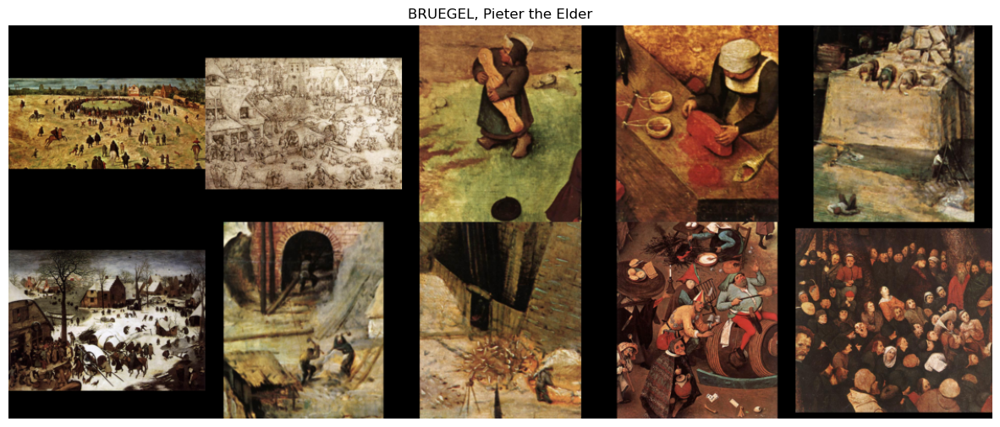

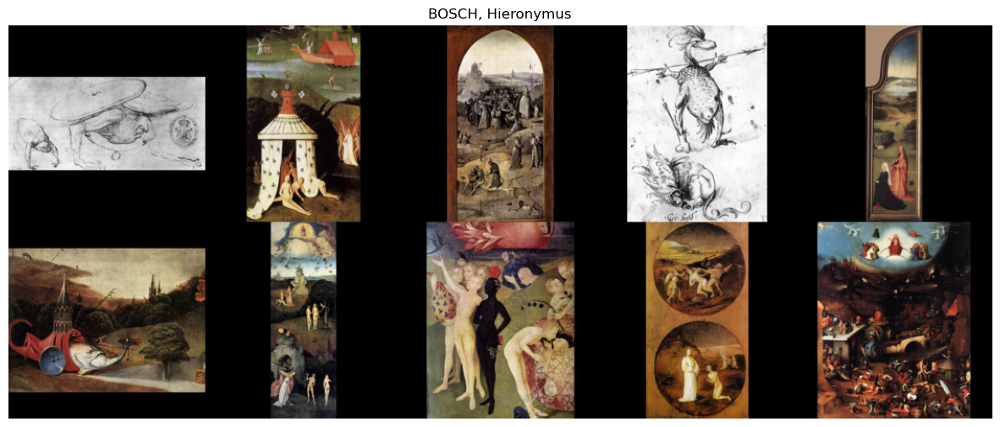

In [43]:
df_sub = df_combined[df_combined["artist"].isin(northern_rens)]
plt.figure(figsize=(15, 15))
display_gallery(df_sub, f"Northern Renaissance Artists: {', '.join(northern_rens)}")

for name in northern_rens:
    plt.figure(figsize=(15, 15))
    display_gallery(df_combined[df_combined["artist"] == name], name)

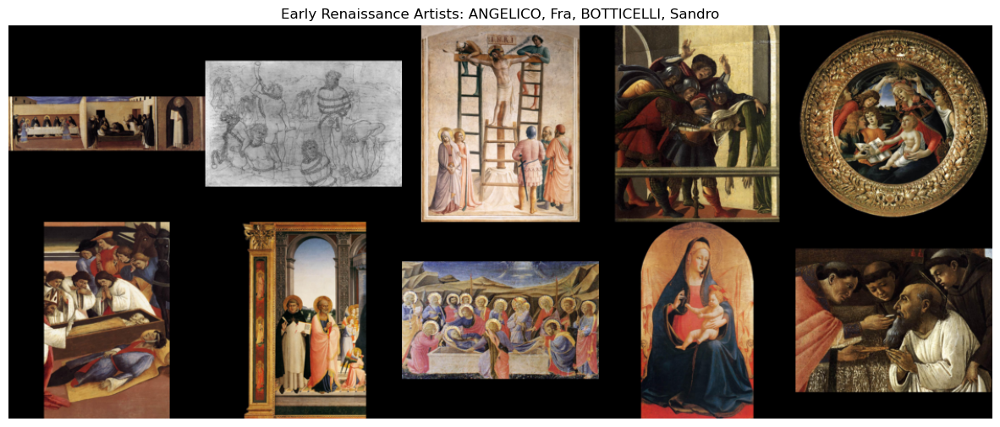

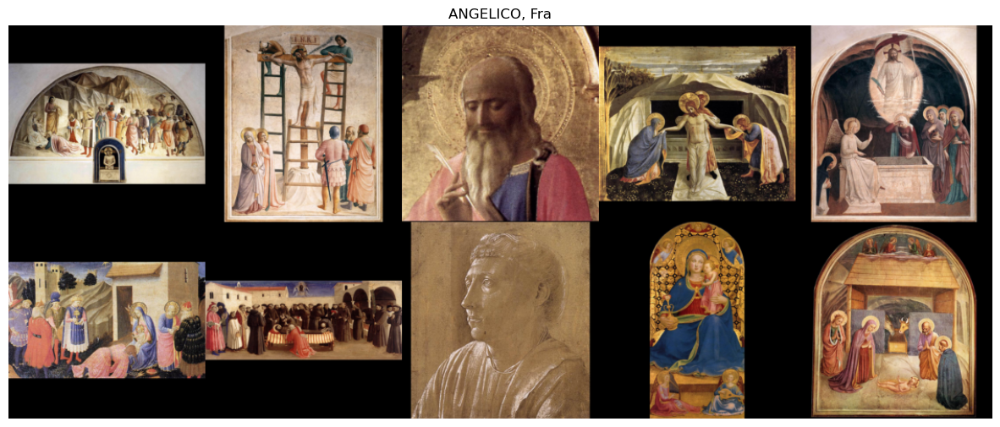

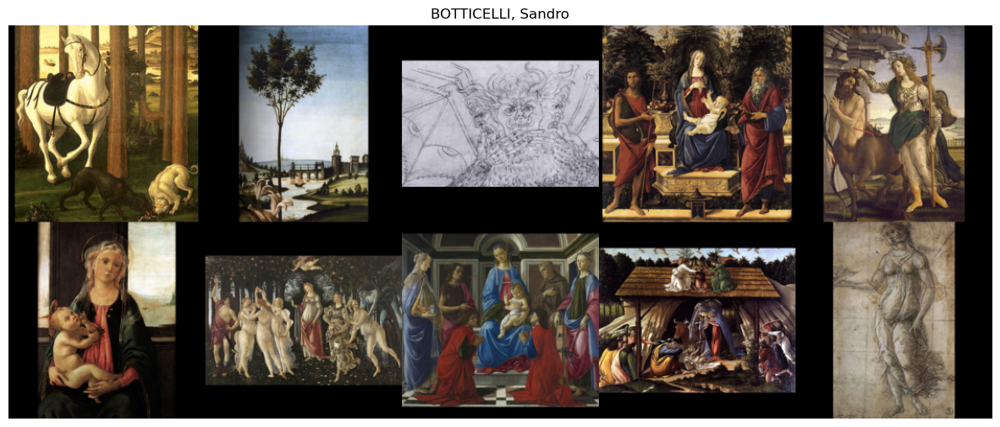

In [44]:
df_sub = df_combined[df_combined["artist"].isin(early_rens)]
plt.figure(figsize=(15, 15))
display_gallery(df_sub, f"Early Renaissance Artists: {', '.join(early_rens)}")

for name in early_rens:
    plt.figure(figsize=(15, 15))
    display_gallery(df_combined[df_combined["artist"] == name], name)

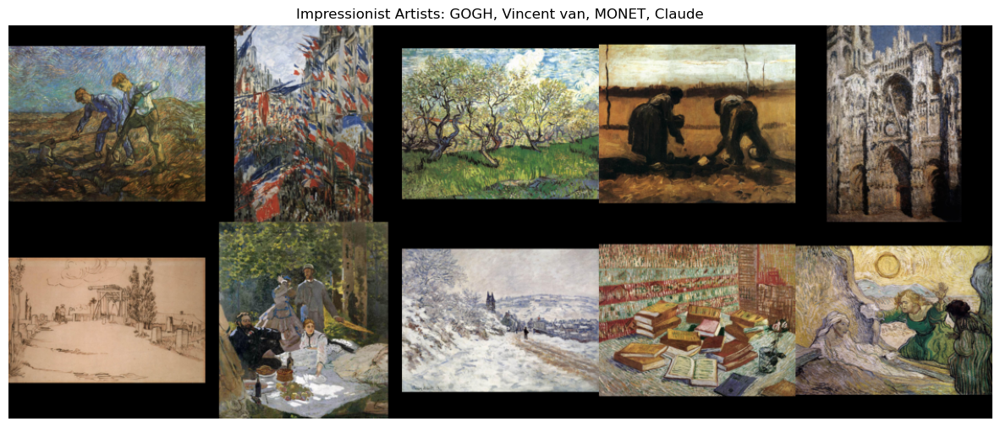

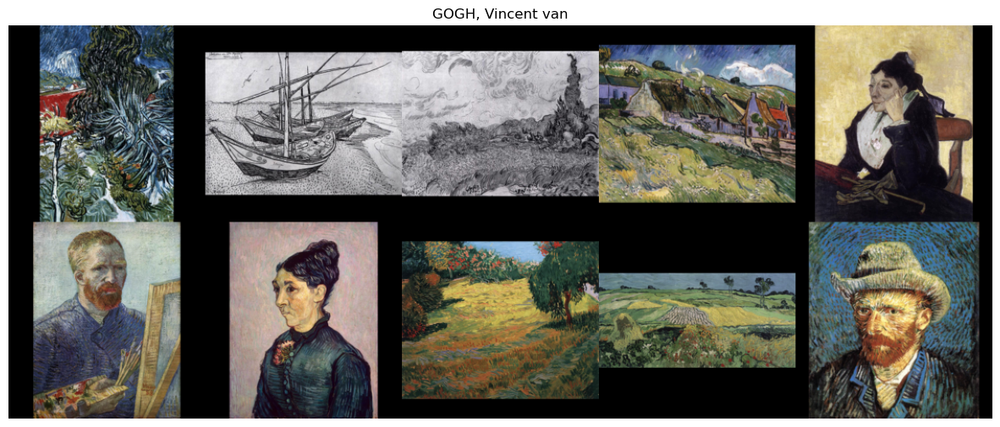

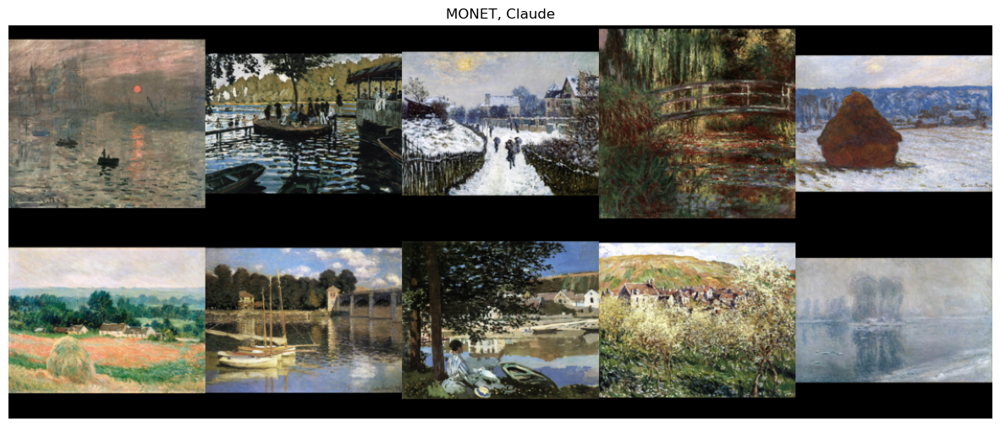

In [45]:
df_sub = df_combined[df_combined["artist"].isin(impressionists)]
plt.figure(figsize=(15, 15))
display_gallery(df_sub, f"Impressionist Artists: {', '.join(impressionists)}")

for name in impressionists:
    plt.figure(figsize=(15, 15))
    display_gallery(df_combined[df_combined["artist"] == name], name)

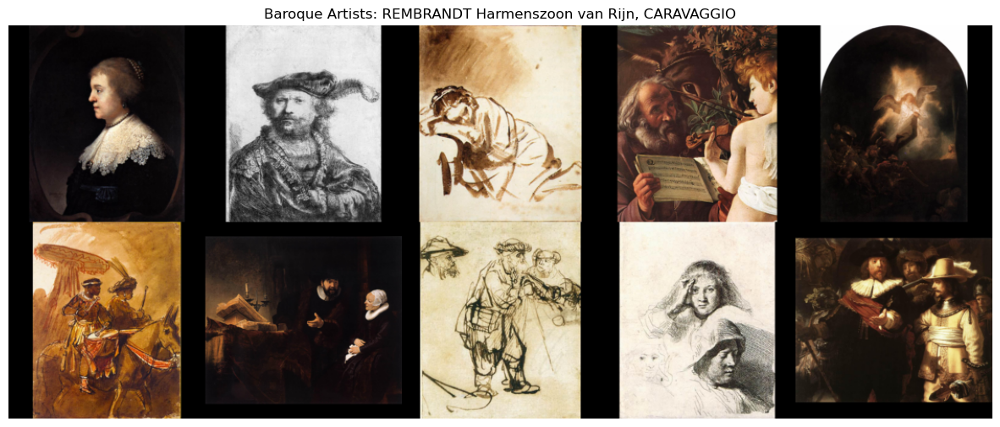

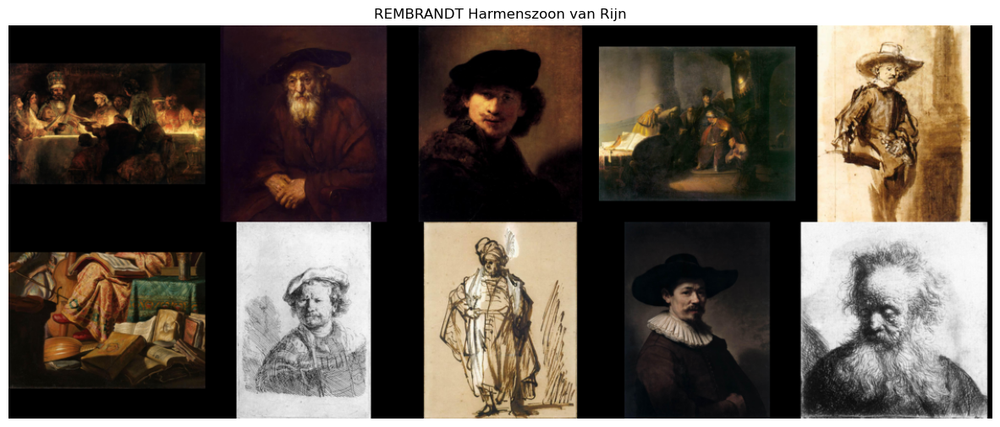

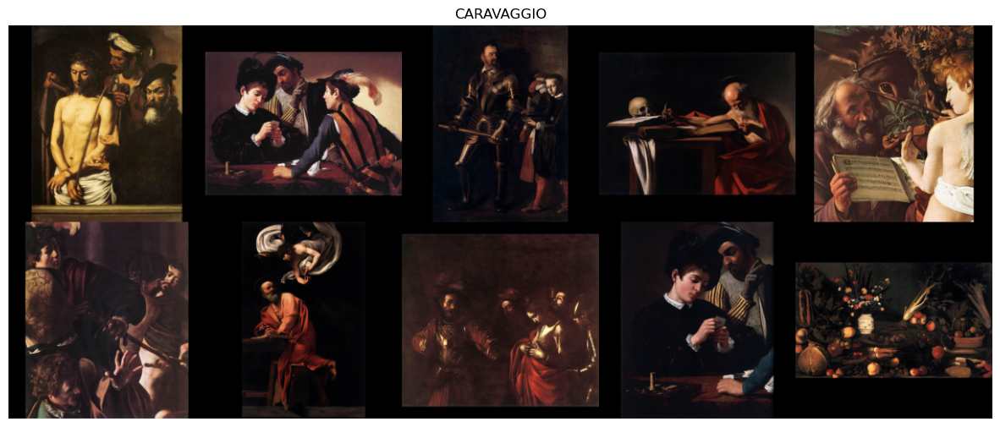

In [46]:
df_sub = df_combined[df_combined["artist"].isin(baroque)]
plt.figure(figsize=(15, 15))
display_gallery(df_sub, f"Baroque Artists: {', '.join(baroque)}")

for name in baroque:
    plt.figure(figsize=(15, 15))
    display_gallery(df_combined[df_combined["artist"] == name], name)

# Save data subset

In [27]:
df_selected = df_combined[df_combined["artist"].isin(romantics + medievals + northern_rens + early_rens + impressionists + baroque)]
df_selected.to_csv("info-artwork.csv", index=False)

In [28]:
import zipfile

# zip up files to load in another kernel
filenames = [f'{DATASET_DIR}artwork/{v}.jpg' for v in df_selected["ID"]]
zipfile_dir = "artwork"
with zipfile.ZipFile('selected_art.zip', 'w') as zipF:
    for file in tqdm(filenames):
        zipF.write(file, f'/{zipfile_dir}/{os.path.basename(file)}', compress_type=zipfile.ZIP_DEFLATED)

  0%|                                                                                         | 0/3198 [00:00<?, ?it/s]


FileNotFoundError: [WinError 3] Das System kann den angegebenen Pfad nicht finden: 'C:\\Users\\rosch\\Desktop\\ML4B\\completeartwork/1034.jpg'

# Some EDA
## Distribution of Image Sizes

In [ ]:
# check distribution of image sizes
list_h = []
list_w = []
list_name = []

for _, row in tqdm(df_selected.iterrows(), total=len(df_selected)):
    path = f'{DATASET_DIR}artwork/{row["ID"]}.jpg'
    if os.path.exists(path):
        img = PIL.Image.open(path)
        list_h.append(img.size[0])
        list_w.append(img.size[1])
        list_name.append(row["ID"])
        
df_stats = pd.DataFrame({"name" : list_name, "height" : list_h, "width" : list_w}) 
df_stats.describe().round(2)